# AIL303m - Mini Capstone - Nhóm 1

Thành viên nhóm: </br>
Đinh Ngọc Ân </br>
Trần Hoàng Minh </br>
Nguyễn Hoàng Việt </br>
Phạm Ngọc Hải Nam </br>
Nguyễn Hoàng Anh </br>
Vũ Minh Thông </br>

### Import modules

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
from folium.plugins import HeatMap
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.metrics import r2_score 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
import plotly.graph_objects as go
from xgboost import XGBClassifier
from statistics import stdev

### Import train dataset, test dataset

In [ ]:
!gdown 1A-Vyxe6f6ZfYK8SqNkhSb_F9SVZeKa6-

Downloading...
From: https://drive.google.com/uc?id=1A-Vyxe6f6ZfYK8SqNkhSb_F9SVZeKa6-
To: /content/test.csv
100% 63.9k/63.9k [00:00<00:00, 70.2MB/s]


In [ ]:
!gdown 13sVP-5tCNLuxzYsE1TjlC7JmB33Al5hN

Downloading...
From: https://drive.google.com/uc?id=13sVP-5tCNLuxzYsE1TjlC7JmB33Al5hN
To: /content/train.csv
100% 122k/122k [00:00<00:00, 104MB/s]


In [ ]:
# Read train dataset
test_df = pd.read_csv('/content/test.csv')

In [ ]:
# Read test dataset
train_df = pd.read_csv('/content/train.csv')

In [ ]:
# View dataset (train data)
train_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


The train dataset has 2000 samples and 21 features

In [ ]:
# View dataset (test data)
test_df.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


The test dataset has 1000 samples and 21 features

In [ ]:
print("Dimension of train dataset: {}".format(train_df.shape))

Dimension of train dataset: (2000, 21)


In [ ]:
# Number of unique elements in each columns
train_df.nunique().to_frame().T

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1094,2,26,2,20,2,63,10,121,8,...,1137,1109,1562,15,19,19,2,2,2,4


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1000 non-null   int64  
 1   battery_power  1000 non-null   int64  
 2   blue           1000 non-null   int64  
 3   clock_speed    1000 non-null   float64
 4   dual_sim       1000 non-null   int64  
 5   fc             1000 non-null   int64  
 6   four_g         1000 non-null   int64  
 7   int_memory     1000 non-null   int64  
 8   m_dep          1000 non-null   float64
 9   mobile_wt      1000 non-null   int64  
 10  n_cores        1000 non-null   int64  
 11  pc             1000 non-null   int64  
 12  px_height      1000 non-null   int64  
 13  px_width       1000 non-null   int64  
 14  ram            1000 non-null   int64  
 15  sc_h           1000 non-null   int64  
 16  sc_w           1000 non-null   int64  
 17  talk_time      1000 non-null   int64  
 18  three_g  

The information of the train data shows that: ```clock_speed``` and ```m_dep``` has an ```float64``` type and the rest have an ```int64``` type

### Data Preprocessing

In [ ]:
#Check for null values in train dataframe
train_df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [ ]:
#Check for null values in test dataframe
test_df.isnull().sum()

id               0
battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
dtype: int64

In [ ]:
for i in train_df:
  print(i, ":", len(train_df[i].unique()))

battery_power : 1094
blue : 2
clock_speed : 26
dual_sim : 2
fc : 20
four_g : 2
int_memory : 63
m_dep : 10
mobile_wt : 121
n_cores : 8
pc : 21
px_height : 1137
px_width : 1109
ram : 1562
sc_h : 15
sc_w : 19
talk_time : 19
three_g : 2
touch_screen : 2
wifi : 2
price_range : 4


In [ ]:
for j in test_df:
  print(j, ":", len(test_df[j].unique()))

id : 1000
battery_power : 721
blue : 2
clock_speed : 26
dual_sim : 2
fc : 20
four_g : 2
int_memory : 63
m_dep : 10
mobile_wt : 121
n_cores : 8
pc : 21
px_height : 694
px_width : 743
ram : 872
sc_h : 15
sc_w : 19
talk_time : 19
three_g : 2
touch_screen : 2
wifi : 2


***THE DATA IS VERY CLEANED AND HAVE HIGH QUALITY, THUS NOT MUCH CAN BE DONE IN THIS STEP***

### Data exploratory

**USING PANDAS PROFILING TO GET A FULL GRASP OF ALL THE COLUMN AND THEIR CHARACTERISTICS AS WELL AS CORRELATION BETWEEN THE FEATURES**

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
train_profile = ProfileReport(train_df, title="Report on train data", explorative=True)
# train_profile.to_widgets()

/usr/local/lib/python3.9/dist-packages/pandas_profiling/profile_report.py:405: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train_profile.to_notebook_iframe()

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Number of mobile type

In [ ]:
px.bar(x=[f"Type {i}" for i in range(1, 5)], y=train_df.groupby(["price_range"])["price_range"].count())

***Each type of mobile phone has exactly 500 row. The data is very balanced.***

Box plot of target feature

In [ ]:
px.box(train_df.price_range)

Drawing hist plots to check the distribution of all columns

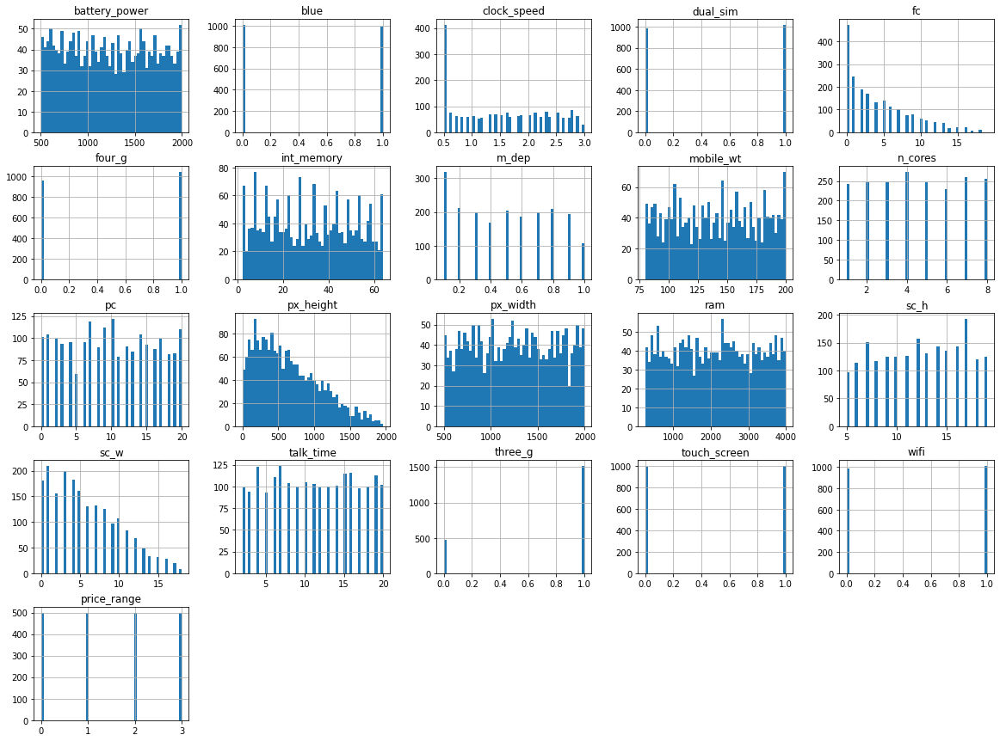

In [ ]:
# only in a Jupyter notebook
%matplotlib inline 

train_df.hist(bins=50, figsize=(20,15))
plt.show()

In this next cell, we calculate the correlation score of all the feature to the target output

In [ ]:
corr_score = train_df.corr()
nghao = corr_score.price_range
px.bar(corr_score.price_range.sort_values()[:-1], color=corr_score.price_range[:-1])

Ram has a very correlation with price range, which is understandable since ram is very expensive

### Process data for training



> Split the data into X and Y







In [ ]:
train_df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
X = train_df[['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi']]
Y = train_df[['price_range']]

In [ ]:
X

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1


In [ ]:
Y

,price_range
0,1
1,2
2,2
3,2
4,1
...,...
1995,0
1996,2
1997,3
1998,0


In [ ]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=10,random_state=30)



> Scale x_train & x_test dataframes:



In [ ]:
scaler=StandardScaler()
scaled = scaler.fit_transform(train_df)


x_train_scaled = scaler.fit_transform(x_train) 
x_test_scaled=scaler.transform(x_test)
print("Mean value:",x_train_scaled.mean(axis=0))
print("SD value:",x_train_scaled.std(axis=0))

Mean value: [ 1.57334463e-16  6.85166209e-17  1.21807326e-16  7.54951657e-17
 -1.06581410e-16  6.09036631e-17 -3.67959631e-17 -2.91830052e-17
  2.20775779e-16  5.90004236e-17  5.07530526e-17  7.35919262e-17
  5.07530526e-17  1.72560379e-16 -2.53765263e-17 -6.59789683e-17
 -1.47183852e-16 -6.21724894e-17  6.09036631e-17 -2.53765263e-18]
SD value: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


**MODEL**



> *Random Forest*



In [ ]:
model_rf = RandomForestClassifier(random_state=42)
model_rf.fit(x_train_scaled, y_train)
score_train = model_rf.score(x_train_scaled, y_train)
score_test = model_rf.score(x_test_scaled, y_test)
print("Random Forest Classifier train phase:", score_train)
print("Random Forest Classifier test phase:", score_test)

Random Forest Classifier train phase: 1.0
Random Forest Classifier test phase: 0.8516666666666667


In [ ]:
predict = model_rf.predict(x_test_scaled)  # test the output by changing values
predict

array([3, 0, 1, 1, 1, 1, 3, 3, 2, 1])

In [ ]:
error = mean_absolute_error(predict,y_test)
error#error

0.2

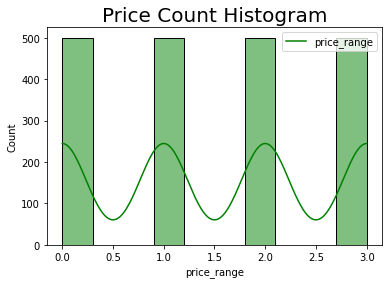

In [ ]:
#set figure
f, ax = plt.subplots(1,1)

#graph histogram
sns.histplot(data = train_df, x = "price_range", color='g', bins=10, kde = True, legend=False)

#Set title
ax.set_title("Price Count Histogram",  fontsize=20)

#set legend
plt.legend(loc='upper right', labels=['price_range'])

### Another machine learning model



> ***Support Vector Machine***







In [ ]:
X = train_df.drop('price_range', axis=1)
Y = train_df['price_range'].ravel()

In [ ]:
print('X:', X.shape, '\nY:', Y.shape)

X: (2000, 20) 
Y: (2000,)


Find the best test size

In [ ]:
test_size = np.arange(start=0.2, stop=0.35, step=0.05)

score = []

for size in test_size:
  x_train1, x_test1, y_train1, y_test1 = train_test_split(X, Y, test_size= size, random_state= 0)
  svm_model = svm.SVC()
  svm_model.fit(x_train1, y_train1)
  score.append(svm_model.score(x_test1, y_test1))

results = pd.DataFrame({'Test size': test_size, 'Score': score})
results.sort_values(by= ['Score'], ascending= False, inplace=True)
results.style.highlight_max(color='#acd9a8')

,Test size,Score
0,0.200000,0.955000
1,0.250000,0.954000
2,0.300000,0.948333


According to the code cell above, we decide to choose the test size **0.2** for **SVM** model

Train Test Split

In [ ]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(X, Y, stratify=Y, test_size = 0.2, random_state = 0)

In [ ]:
# check the shape
print('X train shape:', x_train1.shape)
print('X test shape:', x_test1.shape)
print('Y train shape:', y_train1.shape)
print('Y test shape:', y_test1.shape)

X train shape: (1600, 20)
X test shape: (400, 20)
Y train shape: (1600,)
Y test shape: (400,)


Feature Scaling

In [ ]:
scaler = StandardScaler()

x_train1 = scaler.fit_transform(x_train1)

x_test1 = scaler.fit_transform(x_test1)

Train SVM Model

In [ ]:
svm_model = svm.SVC(probability=True)

svm_model.fit(x_train1, y_train1)

SVC(probability=True)

In [ ]:
y_pred1 = svm_model.predict(x_test1)

Check Accuracy Score

In [ ]:
print('Model accuracy score: {0:0.4f}'.format(accuracy_score(y_test1, y_pred1)))
svm_base_score = svm_model.score(x_test1, y_test1)

Model accuracy score: 0.8950


Check for **Overfitting** and **Underfitting**

In [ ]:
# Scores on training and test set
print('Training set score: {:.4f}'.format(svm_model.score(x_train1, y_train1)))
print('Test set score: {:.4f}'.format(svm_model.score(x_test1, y_test1)))

Training set score: 0.9812
Test set score: 0.8950


* The training set scores represents how well the model fits the data it was trained on.
* The test set score represents how well the model generalizes to new, unseen data.
> In this case, it looks like the model achieved a score of 0.9812 on the training set and 0.8950 on the test set. This suggests that the model is performing well on both sets of data but is performing slightly better on the training set than on the test set.



K-Fold Cross-validation

In [ ]:
kf = KFold(n_splits=10, shuffle=False)

Cross Validation Accuracy

In [ ]:
score = cross_val_score(svm_model, x_train1, y_train1, cv=kf, scoring='accuracy')
svm_model_cv_score = score.mean()
svm_model_stdev = stdev(score)
print('Cross Validation Accuracy scores are:\n {}'.format(score))

Cross Validation Accuracy scores are:
 [0.83125 0.8625  0.89375 0.88125 0.83125 0.875   0.85    0.875   0.8875
 0.85625]


In [ ]:
accuracy = ['Cross Validation Accuracy']
svm_A = pd.DataFrame({'CV Mean': svm_model_cv_score, 'Standard Deviation': svm_model_stdev}, index=accuracy)
svm_A

,CV Mean,Standard Deviation
Cross Validation Accuracy,0.864375,0.022058




*   Using the ```mean cross-validation```, we can conclude that we expect the model to be around 86,43% accurate on average
*   We can see that 10-fold cross validation accuracy ***does not*** result in performance improvement for this model



Confusion Matrix

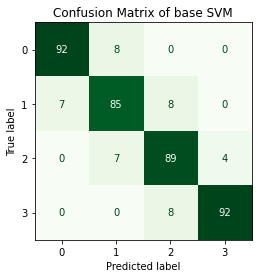

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
ConfusionMatrixDisplay.from_estimator(svm_model, x_test1, y_test1, colorbar=False, cmap='Greens')
plt.title('Confusion Matrix of base SVM')
plt.grid(False)

In [ ]:
print(classification_report(y_test1, y_pred1))

              precision    recall  f1-score   support

           0       0.93      0.92      0.92       100
           1       0.85      0.85      0.85       100
           2       0.85      0.89      0.87       100
           3       0.96      0.92      0.94       100

    accuracy                           0.90       400
   macro avg       0.90      0.90      0.90       400
weighted avg       0.90      0.90      0.90       400



* The classification report above is a summary of key metrics used to assess the quality of a classification model. These metrics include precision, recall, F1-score and support for each class.
* Precision is the percentage of correct positive predictions relative to total positive predictions. Recall is the percentage of correct positive predictions relative to total actual positives. F1-score is a weighted mean of precision and recall.
* In this model, there are four classes (0, 1, 2, 3) represent for the price range (low cost, medium cost, high cost and very high cost).
* The accuracy of the model is 0.9 which means that it correctly classified 90% of the samples.

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [ ]:
# Define a function calculates all desired performance metrics for a given model
def metrics_calculator(y_test, y_predict, model_name):
  result = pd.DataFrame(data=[accuracy_score(y_test, y_predict),
                              precision_score(y_test, y_predict, average='macro'),
                              recall_score(y_test, y_predict, average='macro'),
                              f1_score(y_test, y_predict, average='macro')],
                        index=['Accuracy', 'Precision', 'Recall', 'F1-score'],
                        columns = [model_name])
  return result

In [ ]:
baseSVM_result = metrics_calculator(y_test1, y_pred1, 'Base SVM')
baseSVM_result.T

,Accuracy,Precision,Recall,F1-score
Base SVM,0.895,0.896311,0.895,0.895423


The output show the accuracy, precision, recall and F1-scores of a base Support Vector Machine model

Tune SVM Hyperparameters using ```GridSearchCV```

In [ ]:
# Finding optimal hyperparameters (GridSearchCV)
from sklearn.model_selection import RepeatedStratifiedKFold
# Define model

model = svm.SVC(probability=True)

# Define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)

# Define search parameters   
C = [0.1, 1, 10, 100]
kernel = ['linear', 'poly', 'rbf', 'sigmoid']
gamma = ['scale', 'auto']

#degree = [2, 3, 4]
#coef0 = [0, 1, 2]

param_grid = {'C': C, 'kernel': kernel, 'gamma': gamma} 

# Define search
search = GridSearchCV(model, param_grid, scoring='accuracy', n_jobs=-1, cv=cv)

# Execute search
GridSearchCV = search.fit(x_train1, y_train1)

# Set the clf to the best combination of parameters
svm_modelcv = GridSearchCV.best_estimator_

# Summarize result
print('Best Score: %s' % GridSearchCV.best_score_)
print('Best Hyperparameters: %s' % GridSearchCV.best_params_)

Best Score: 0.9666666666666666
Best Hyperparameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}


* The output shows the best score and hyperparameters for a SVM model.
* Hyperparameters are parameters that are set before training a model, and they can affect how well the model performs.
* In this case, it looks like the best hyperparameters for this particular SVM model were found to be a C value of 10, a gamma value of ‘scale’, and a kernel function of ‘linear’.
*  The C parameter controls the trade-off between achieving a low training error and a low testing error that is the ability to generalize your classifier to unseen data. The gamma parameter defines how far the influence of a single training example reaches. The kernel function transforms the training dataset into higher dimensions to make it linearly separable.

Tuned SVM Model Evaluation

In [ ]:
# Train tuned model
svm_modelcv.fit(x_train1, y_train1)

SVC(C=10, kernel='linear', probability=True)

In [ ]:
# Predict Tuned model
y_pred = svm_modelcv.predict(x_test1)

In [ ]:
# Check tuned model accuracy score
print('Model accuracy score after tuned: {0:0.4f}'.format(accuracy_score(y_test1, y_pred)))

Model accuracy score after tuned: 0.9725


Tuned Model Confusion Matrix

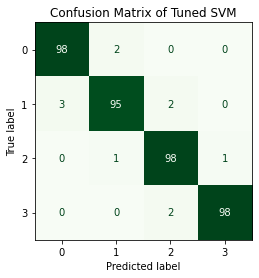

In [ ]:
ConfusionMatrixDisplay.from_estimator(svm_modelcv, x_test1, y_test1, colorbar=False, cmap='Greens')
plt.title('Confusion Matrix of Tuned SVM')
plt.grid(False)

Tuned model performance metrics

In [ ]:
tunedSVM_result = metrics_calculator(y_test1, y_pred, 'Tuned SVM')
tuned_score = accuracy_score(y_test1, y_pred)
tunedSVM_result

,Tuned SVM
Accuracy,0.972500
Precision,0.972592
Recall,0.972500
F1-score,0.972485


#Logistic Regression Model

In [ ]:
model = LogisticRegression(solver='liblinear', random_state=42)
model.fit(X,Y)

LogisticRegression(random_state=42, solver='liblinear')

In [ ]:
print(model.intercept_)
print(model.coef_)

[ 8.36855579e+00  2.66697592e-03 -9.96666447e-01 -1.16077947e+01]
[[-3.47265095e-03  1.81114023e-01  4.39923732e-01  3.58245864e-01
  -1.99675453e-02 -7.63167697e-02  6.77827509e-03  5.25892297e-01
   1.74244794e-02  1.76469187e-01  3.39707374e-02 -2.47375489e-03
  -1.52092284e-03 -6.86486149e-03  1.14159868e-01  1.33826419e-03
   4.05101745e-02  3.02467650e-01  4.46419993e-01  5.54236796e-01]
 [-9.03723497e-05  3.68572621e-03 -4.97391167e-02  2.27607269e-02
   2.81646262e-03  1.24893729e-02  1.29428204e-03  5.47703682e-02
   4.04395831e-04 -6.21519277e-02  2.59974530e-03  1.66000687e-04
  -5.88625865e-05 -5.30688608e-04  1.61076820e-03 -1.12823983e-02
   1.93926262e-02 -1.68191116e-03  3.11987734e-02  3.33241125e-03]
 [-1.81047072e-04 -8.59987706e-02 -3.49319474e-02 -1.49528152e-01
   1.72903353e-02 -2.20674991e-01 -7.01961463e-03 -2.69114160e-01
   1.81318183e-03  2.74822829e-02 -1.16860112e-02  4.13123353e-05
  -2.55819756e-04  5.33212977e-04 -3.81406140e-02  5.49840695e-03
  -7.544

In [ ]:
model.predict(X)

array([2, 3, 2, ..., 3, 0, 3])

In [ ]:
ln_reg_score = model.score(X,Y)
ln_reg_score

0.82

Model has score 0.812, quite a good one !!!

Logistic Regression With GridSearch

In [ ]:
x_train, x_test, y_train, y_test=train_test_split(X,Y,test_size=0.3)

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
grid={"C":np.logspace(-3,3,7), "penalty":["l1","l2"]}# l1 lasso l2 ridge
logreg=LogisticRegression()
logreg_cv=GridSearchCV(logreg,grid,cv=10)
logreg_cv.fit(x_train,y_train)

print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)
logreg_cv_score = logreg_cv.best_score_

/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.9/dist-packages/sklearn/lin

tuned hpyerparameters :(best parameters)  {'C': 100.0, 'penalty': 'l2'}
accuracy : 0.6414285714285715


/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.9/dist-packages/sklearn/mod

In [ ]:
logreg2=LogisticRegression(C=1,penalty='l2')
logreg2.fit(x_train,y_train)
print("score",logreg2.score(x_test,y_test))
logreg2_score = logreg2.score(x_test,y_test)

score 0.635


/usr/local/lib/python3.9/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [ ]:
score_test


0.8516666666666667

In [ ]:
logreg2_score

0.635

In [ ]:
logreg_cv_score

0.6414285714285715

In [ ]:
ln_reg_score

0.82

In [ ]:
svm_base_score

0.895

In [ ]:
tuned_score

0.9725

In [ ]:
tast = [logreg2_score, logreg_cv_score, ln_reg_score, score_test, svm_base_score, tuned_score]
ind = ["Logistic 2", "Logistic with Gridsearch", "Logistic 1","Random forest", "SVM Base", "Tuned SVM"]

In [ ]:
fig = px.bar(x=ind, y=tast, text_auto=True, color=ind)
fig.update_layout(showlegend=False, title="Score comparision")